# Классификация научно-фантастических вселенных
## ResNet50 vs EfficientNetB0 (PyTorch)

**Задача:** 3-классовая классификация изображений по вселенным:
- 🌌 **Star Gate**
- 🖖 **Star Trek**  
- ⚔️ **Star Wars**

**Датасет:** https://www.kaggle.com/datasets/joebeachcapital/star-warstrekgate-universes

## 1. Импорты и конфигурация

In [1]:
import os, copy, time, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from pathlib import Path
from PIL import Image
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models
from torchvision.models import ResNet50_Weights, EfficientNet_B0_Weights
from tqdm import tqdm
import kagglehub

from sklearn.metrics import (
    classification_report, confusion_matrix, roc_curve, auc,
    accuracy_score, precision_score, recall_score, f1_score
)
from sklearn.preprocessing import label_binarize

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch  : {torch.__version__}')
print(f'Device   : {DEVICE}')
if DEVICE.type == 'cuda':
    print(f'GPU      : {torch.cuda.get_device_name(0)}')

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

PyTorch  : 2.11.0+cu128
Device   : cuda
GPU      : NVIDIA GeForce GTX 1660 SUPER


## 2. Конфигурация датасета

**⬇ Укажите путь к папке с датасетом**

In [2]:
# Download latest version
DATASET_PATH = kagglehub.dataset_download("joebeachcapital/star-warstrekgate-universes")+"/universe"

print("Path to dataset files:", DATASET_PATH)

# Папки для сохранения артефактов и моделей
ARTIFACTS_DIR = Path('artifacts')
MODELS_DIR    = Path('models')
ARTIFACTS_DIR.mkdir(exist_ok=True)
MODELS_DIR.mkdir(exist_ok=True)
print(f'Артефакты → {ARTIFACTS_DIR.resolve()}')
print(f'Модели    → {MODELS_DIR.resolve()}')

CLASS_NAMES   = ['Star Gate', 'Star Trek', 'Star Wars']
CLASS_COLORS  = ['#E63946', '#457B9D', '#F4A261']   # цвета для графиков
CLASS_EMOJIS  = ['🌌', '🖖', '⚔️']

IMG_SIZE      = 224
BATCH_SIZE    = 32
NUM_CLASSES   = 3
EPOCHS_STAGE1 = 15
LR_STAGE1     = 1e-3
EPOCHS_STAGE2 = 15
LR_STAGE2     = 1e-5
UNFREEZE_N    = 30

print(f'\nDataset  : {DATASET_PATH}')
print(f'Classes  : {CLASS_NAMES}')
print(f'Img size : {IMG_SIZE}x{IMG_SIZE}  Batch: {BATCH_SIZE}')

Path to dataset files: C:\Users\User\.cache\kagglehub\datasets\joebeachcapital\star-warstrekgate-universes\versions\1/universe
Артефакты → C:\Users\User\git-package\aie-course\homeworks\GroupHW1Kira\artifacts
Модели    → C:\Users\User\git-package\aie-course\homeworks\GroupHW1Kira\models

Dataset  : C:\Users\User\.cache\kagglehub\datasets\joebeachcapital\star-warstrekgate-universes\versions\1/universe
Classes  : ['Star Gate', 'Star Trek', 'Star Wars']
Img size : 224x224  Batch: 32


## 3. EDA — исследовательский анализ данных

In [3]:
dataset_dir = Path(DATASET_PATH)

# Автоматически определяем папки классов
subdirs = sorted([d for d in dataset_dir.iterdir() if d.is_dir()])
print('Найденные папки классов:')
for d in subdirs:
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) + list(d.glob('*.webp'))
    print(f'  {d.name:<25}: {len(imgs):>5} изображений')

# Подсчёт по всем поддиректориям
class_counts = {}
for d in subdirs:
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) + list(d.glob('*.webp'))
    class_counts[d.name] = len(imgs)

total_images = sum(class_counts.values())
print(f'\nВсего изображений: {total_images}')

Найденные папки классов:
  star gate                :   130 изображений
  star trek                :   135 изображений
  star wars                :   132 изображений

Всего изображений: 397


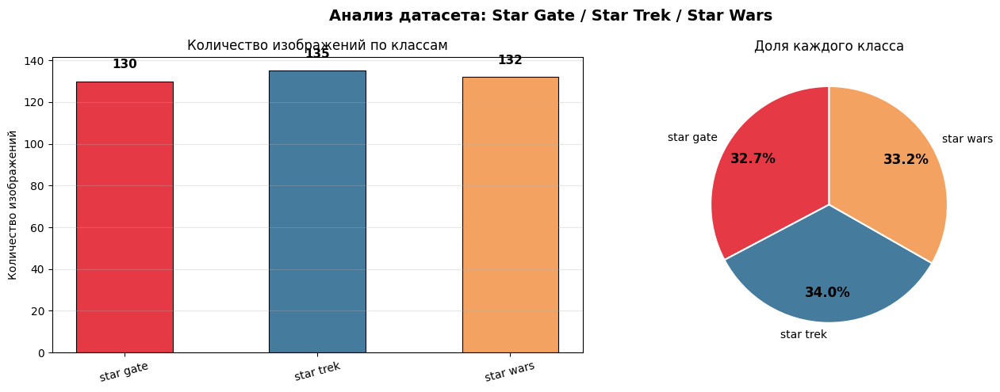

Сохранено: artifacts/class_distribution.png


In [4]:
# Гистограмма распределения классов
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Анализ датасета: Star Gate / Star Trek / Star Wars', fontsize=14, fontweight='bold')

# Bar chart
ax = axes[0]
bars = ax.bar(class_counts.keys(), class_counts.values(),
              color=CLASS_COLORS[:len(class_counts)], edgecolor='black', lw=0.8, width=0.5)
for bar, val in zip(bars, class_counts.values()):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+5,
            str(val), ha='center', va='bottom', fontsize=11, fontweight='bold')
ax.set_title('Количество изображений по классам', fontsize=12)
ax.set_ylabel('Количество изображений')
ax.tick_params(axis='x', rotation=15)
ax.grid(axis='y', alpha=0.3)

# Pie chart
ax2 = axes[1]
wedges, texts, autotexts = ax2.pie(
    class_counts.values(), labels=class_counts.keys(),
    colors=CLASS_COLORS[:len(class_counts)], autopct='%1.1f%%',
    startangle=90, pctdistance=0.75,
    wedgeprops=dict(linewidth=1.5, edgecolor='white')
)
for at in autotexts: at.set_fontsize(12); at.set_fontweight('bold')
ax2.set_title('Доля каждого класса', fontsize=12)

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/class_distribution.png')

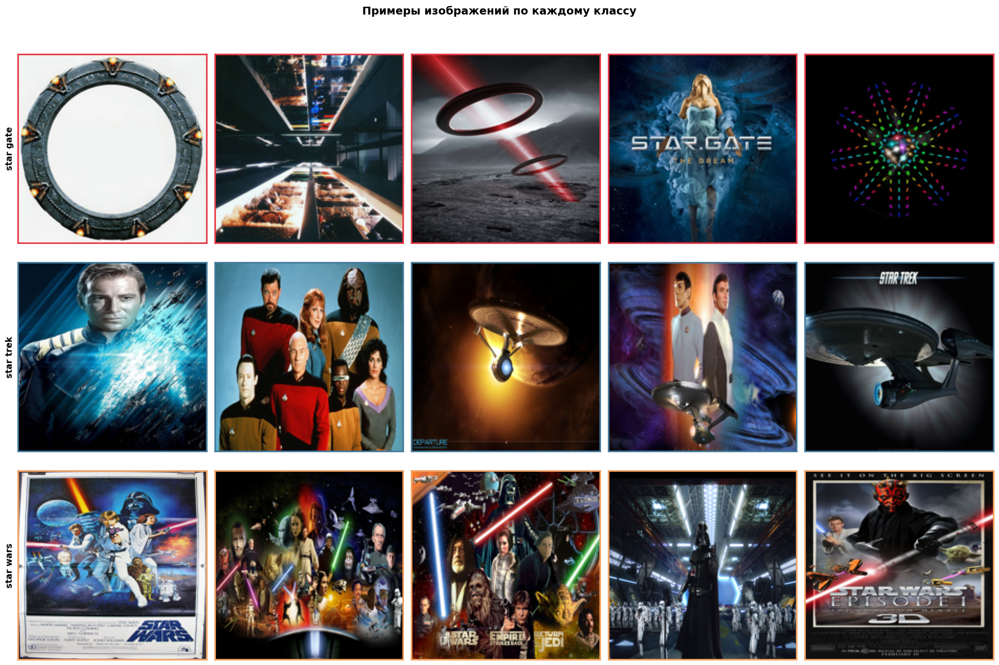

Сохранено: artifacts/sample_images.png


In [5]:
# Примеры изображений из каждого класса (3x5 grid)
fig, axes = plt.subplots(len(subdirs), 5, figsize=(18, 4*len(subdirs)))
if len(subdirs) == 1: axes = [axes]

for row, d in enumerate(subdirs):
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) + list(d.glob('*.webp'))
    np.random.shuffle(imgs)
    for col in range(5):
        ax = axes[row][col]
        if col < len(imgs):
            try:
                ax.imshow(Image.open(imgs[col]).convert('RGB').resize((180,180)))
            except:
                ax.set_facecolor('#f0f0f0')
        else:
            ax.set_facecolor('#f0f0f0')
        if col == 0:
            ax.set_ylabel(d.name, fontsize=11, fontweight='bold', rotation=90, labelpad=5)
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(CLASS_COLORS[row % len(CLASS_COLORS)])
            spine.set_linewidth(2)

plt.suptitle('Примеры изображений по каждому классу', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'sample_images.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/sample_images.png')

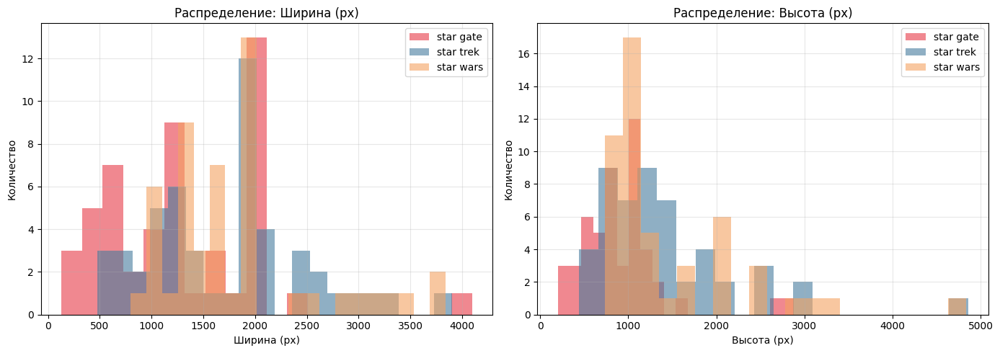

Сохранено: artifacts/image_size_distribution.png
Средний размер: 1603 x 1263 px


In [6]:
# Анализ размеров изображений
widths, heights, cls_labels = [], [], []
for row_i, d in enumerate(subdirs):
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) + list(d.glob('*.webp'))
    sample = imgs[:min(50, len(imgs))]
    for p in sample:
        try:
            w, h = Image.open(p).size
            widths.append(w); heights.append(h); cls_labels.append(d.name)
        except: pass

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for i, (vals, title) in enumerate([(widths,'Ширина (px)'), (heights,'Высота (px)')]):
    ax = axes[i]
    for j, d in enumerate(subdirs):
        mask = [l == d.name for l in cls_labels]
        v = [v for v, m in zip(vals, mask) if m]
        ax.hist(v, bins=20, alpha=0.6, label=d.name, color=CLASS_COLORS[j % len(CLASS_COLORS)])
    ax.set_title(f'Распределение: {title}', fontsize=12)
    ax.set_xlabel(title); ax.set_ylabel('Количество'); ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'image_size_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/image_size_distribution.png')
print(f'Средний размер: {np.mean(widths):.0f} x {np.mean(heights):.0f} px')

## 4. Подготовка данных и аугментация

In [7]:
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.1),
    transforms.RandomRotation(25),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05),
    transforms.RandomAffine(degrees=0, translate=(0.1,0.1), shear=8),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.80,1.0)),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD),
    transforms.RandomErasing(p=0.1, scale=(0.02,0.1))  # случайное стирание
])

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

full_ds = datasets.ImageFolder(DATASET_PATH)
n_total = len(full_ds)
n_val   = int(0.2 * n_total)
n_train = n_total - n_val

gen     = torch.Generator().manual_seed(SEED)
indices = torch.randperm(n_total, generator=gen).tolist()
train_idx, val_idx = indices[:n_train], indices[n_train:]

train_ds_all = datasets.ImageFolder(DATASET_PATH, transform=train_tf)
val_ds_all   = datasets.ImageFolder(DATASET_PATH, transform=val_tf)

train_dataset = Subset(train_ds_all, train_idx)
val_dataset   = Subset(val_ds_all,   val_idx)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=2, pin_memory=(DEVICE.type=='cuda'))
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=2, pin_memory=(DEVICE.type=='cuda'))

idx_to_class    = {v: k for k, v in full_ds.class_to_idx.items()}
classes_ordered = [idx_to_class[i] for i in range(NUM_CLASSES)]

print(f'Train: {n_train}  |  Val: {n_val}')
print(f'Маппинг: {full_ds.class_to_idx}')

Train: 364  |  Val: 91
Маппинг: {'star gate': 0, 'star trek': 1, 'star wars': 2}


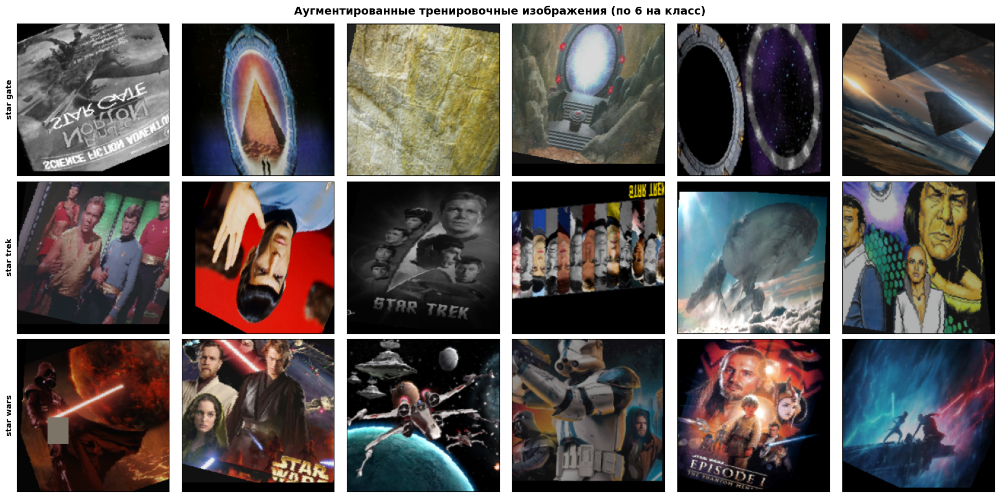

Сохранено: artifacts/augmented_samples.png


In [8]:
mean_np = np.array(MEAN); std_np = np.array(STD)

def denorm(t):
    img = t.numpy().transpose(1,2,0)
    return np.clip(std_np * img + mean_np, 0, 1)

imgs_b, labels_b = next(iter(train_loader))

fig, axes = plt.subplots(3, 6, figsize=(18, 9))
fig.suptitle('Аугментированные тренировочные изображения (по 6 на класс)', fontsize=14, fontweight='bold')

# Группируем по классам
per_class = {c: [] for c in range(NUM_CLASSES)}
for i in range(len(labels_b)):
    c = labels_b[i].item()
    if len(per_class[c]) < 6:
        per_class[c].append(imgs_b[i])

for row in range(NUM_CLASSES):
    for col in range(6):
        ax = axes[row][col]
        if col < len(per_class[row]):
            ax.imshow(denorm(per_class[row][col]))
        if col == 0:
            ax.set_ylabel(classes_ordered[row], fontsize=10, fontweight='bold')
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'augmented_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/augmented_samples.png')

## 5. Построение и обучение моделей
### 5.1 Вспомогательные функции

In [13]:
def build_resnet50(freeze_base=True):
    """ResNet50 с кастомной классификационной головой."""
    m = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    if freeze_base:
        for p in m.parameters(): p.requires_grad = False
    m.fc = nn.Sequential(
        nn.Linear(m.fc.in_features, 256),
        nn.BatchNorm1d(256),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),
        nn.Linear(256, 128),
        nn.ReLU(inplace=True),
        nn.Dropout(0.3),
        nn.Linear(128, NUM_CLASSES)
    )
    return m


def build_efficientnet(freeze_base=True):
    """EfficientNetB0 с кастомной классификационной головой."""
    m = models.efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
    if freeze_base:
        for p in m.features.parameters(): p.requires_grad = False
    in_f = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(in_f, 256),
        nn.BatchNorm1d(256),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),
        nn.Linear(256, 128),
        nn.ReLU(inplace=True),
        nn.Dropout(0.3),
        nn.Linear(128, NUM_CLASSES)
    )
    return m


def unfreeze_last(model, n):
    for p in list(model.parameters())[-n:]: p.requires_grad = True
    tr  = sum(p.numel() for p in model.parameters() if p.requires_grad)
    tot = sum(p.numel() for p in model.parameters())
    print(f'  Trainable: {tr:,} / {tot:,}')


def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    loss_sum, correct, total = 0.0, 0, 0
    for imgs, labels in tqdm(loader, leave=False, desc='Train'):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward(); optimizer.step()
        loss_sum += loss.item() * len(labels)
        correct  += (out.argmax(1) == labels).sum().item()
        total    += len(labels)
    return loss_sum/total, correct/total


@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    loss_sum, correct, total = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        out = model(imgs)
        loss_sum += criterion(out, labels).item() * len(labels)
        correct  += (out.argmax(1) == labels).sum().item()
        total    += len(labels)
    return loss_sum/total, correct/total


def train_stage(model, train_loader, val_loader, epochs, lr, tag):
    criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr,
                           weight_decay=1e-4)
    sched     = lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.3,
                                               patience=3, min_lr=1e-7)
    history   = {'tl':[],'vl':[],'ta':[],'va':[]}
    best_acc, best_w, pat = 0.0, copy.deepcopy(model.state_dict()), 0
    PATIENCE = 7
    print(f'\n--- {tag} | lr={lr} ---')
    for ep in range(1, epochs+1):
        t0 = time.time()
        tl, ta = train_one_epoch(model, train_loader, criterion, optimizer)
        vl, va = evaluate(model, val_loader, criterion)
        sched.step(vl)
        history['tl'].append(tl); history['vl'].append(vl)
        history['ta'].append(ta); history['va'].append(va)
        print(f'  Ep {ep:02d}/{epochs}  '
              f'loss={tl:.4f} acc={ta:.4f}  '
              f'val_loss={vl:.4f} val_acc={va:.4f}  [{time.time()-t0:.0f}s]')
        if va > best_acc:
            best_acc, best_w, pat = va, copy.deepcopy(model.state_dict()), 0
        else:
            pat += 1
            if pat >= PATIENCE: print(f'  EarlyStopping.'); break
    model.load_state_dict(best_w)
    print(f'  Best val_acc: {best_acc:.4f}')
    return history


def plot_history(h1, h2, name):
    acc  = h1['ta']+h2['ta']; vacc  = h1['va']+h2['va']
    loss = h1['tl']+h2['tl']; vloss = h1['vl']+h2['vl']
    sp   = len(h1['ta']); ep = range(1, len(acc)+1)
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    fig.suptitle(f'История обучения — {name}', fontsize=14, fontweight='bold')
    for ax, tr, vl, title in zip(axes,[acc,loss],[vacc,vloss],['Accuracy','Loss']):
        ax.plot(ep, tr,  'b-o', ms=4, lw=1.5, label='Train')
        ax.plot(ep, vl,  'r-o', ms=4, lw=1.5, label='Val')
        ax.axvline(sp, color='green', ls='--', lw=2, label='Fine-tuning start')
        ax.fill_between(ep, tr, vl, alpha=0.08, color='purple')
        ax.set_title(title, fontsize=12); ax.set_xlabel('Epoch'); ax.legend(); ax.grid(alpha=.3)
    plt.tight_layout()
    plt.savefig(ARTIFACTS_DIR / f'{name}_history.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Сохранено: {ARTIFACTS_DIR}/{name}_history.png')


print('Все функции определены.')

Все функции определены.


### 5.2 Модель 1: ResNet50

In [14]:
print('='*55); print('МОДЕЛЬ 1: ResNet50'); print('='*55)
resnet = build_resnet50(freeze_base=True).to(DEVICE)
tr = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
tot= sum(p.numel() for p in resnet.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')

МОДЕЛЬ 1: ResNet50
Trainable / Total: 558,339 / 24,066,371


In [15]:
h_r1 = train_stage(resnet, train_loader, val_loader, EPOCHS_STAGE1, LR_STAGE1, 'ResNet50 | Stage 1 (head)')


--- ResNet50 | Stage 1 (head) | lr=0.001 ---


  Ep 01/15  loss=0.9389 acc=0.5632  val_loss=0.8467 val_acc=0.8022  [20s]


  Ep 02/15  loss=0.6461 acc=0.7747  val_loss=0.5276 val_acc=0.8462  [18s]


  Ep 03/15  loss=0.5244 acc=0.8379  val_loss=0.4652 val_acc=0.8242  [17s]


  Ep 04/15  loss=0.4350 acc=0.8846  val_loss=0.4419 val_acc=0.8462  [18s]


  Ep 05/15  loss=0.4296 acc=0.8874  val_loss=0.4639 val_acc=0.8352  [18s]


  Ep 06/15  loss=0.3674 acc=0.9231  val_loss=0.4095 val_acc=0.8901  [18s]


  Ep 07/15  loss=0.3265 acc=0.9451  val_loss=0.3970 val_acc=0.8901  [18s]


  Ep 08/15  loss=0.3213 acc=0.9396  val_loss=0.4560 val_acc=0.8571  [18s]


  Ep 09/15  loss=0.3577 acc=0.9203  val_loss=0.4494 val_acc=0.8681  [18s]


  Ep 10/15  loss=0.3278 acc=0.9423  val_loss=0.3872 val_acc=0.9231  [18s]


  Ep 11/15  loss=0.3258 acc=0.9560  val_loss=0.4329 val_acc=0.8571  [18s]


  Ep 12/15  loss=0.3128 acc=0.9341  val_loss=0.4208 val_acc=0.8791  [17s]


  Ep 13/15  loss=0.2715 acc=0.9698  val_loss=0.4181 val_acc=0.8791  [17s]


  Ep 14/15  loss=0.2715 acc=0.9643  val_loss=0.4046 val_acc=0.8901  [18s]


  Ep 15/15  loss=0.2835 acc=0.9670  val_loss=0.4126 val_acc=0.9121  [18s]
  Best val_acc: 0.9231


In [16]:
print('Разморозка ResNet50...')
unfreeze_last(resnet, UNFREEZE_N)
h_r2 = train_stage(resnet, train_loader, val_loader,
                   EPOCHS_STAGE2, LR_STAGE2, 'ResNet50 | Stage 2 (fine-tuning)')
save_path = MODELS_DIR / 'resnet50_scifi.pth'
torch.save(resnet.state_dict(), save_path)
print(f'Модель сохранена: {save_path}')

Разморозка ResNet50...
  Trainable: 11,586,819 / 24,066,371

--- ResNet50 | Stage 2 (fine-tuning) | lr=1e-05 ---


  Ep 01/15  loss=0.3030 acc=0.9533  val_loss=0.3870 val_acc=0.8791  [18s]


  Ep 02/15  loss=0.3034 acc=0.9533  val_loss=0.3970 val_acc=0.8571  [17s]


  Ep 03/15  loss=0.2771 acc=0.9698  val_loss=0.3844 val_acc=0.8791  [19s]


  Ep 04/15  loss=0.2827 acc=0.9643  val_loss=0.3852 val_acc=0.8791  [17s]


  Ep 05/15  loss=0.2877 acc=0.9588  val_loss=0.3875 val_acc=0.9011  [18s]


  Ep 06/15  loss=0.2799 acc=0.9505  val_loss=0.3893 val_acc=0.8681  [18s]


  Ep 07/15  loss=0.3089 acc=0.9478  val_loss=0.3773 val_acc=0.8791  [18s]


  Ep 08/15  loss=0.2660 acc=0.9670  val_loss=0.3774 val_acc=0.8681  [18s]


  Ep 09/15  loss=0.2907 acc=0.9588  val_loss=0.3721 val_acc=0.9121  [18s]


  Ep 10/15  loss=0.2789 acc=0.9643  val_loss=0.3806 val_acc=0.8901  [19s]


  Ep 11/15  loss=0.2794 acc=0.9615  val_loss=0.3736 val_acc=0.9121  [17s]


  Ep 12/15  loss=0.2609 acc=0.9753  val_loss=0.3789 val_acc=0.9011  [18s]


  Ep 13/15  loss=0.2798 acc=0.9560  val_loss=0.3778 val_acc=0.8791  [17s]


  Ep 14/15  loss=0.2771 acc=0.9588  val_loss=0.3792 val_acc=0.9011  [18s]


  Ep 15/15  loss=0.2864 acc=0.9753  val_loss=0.3785 val_acc=0.8901  [17s]
  Best val_acc: 0.9121
Модель сохранена: models\resnet50_scifi.pth


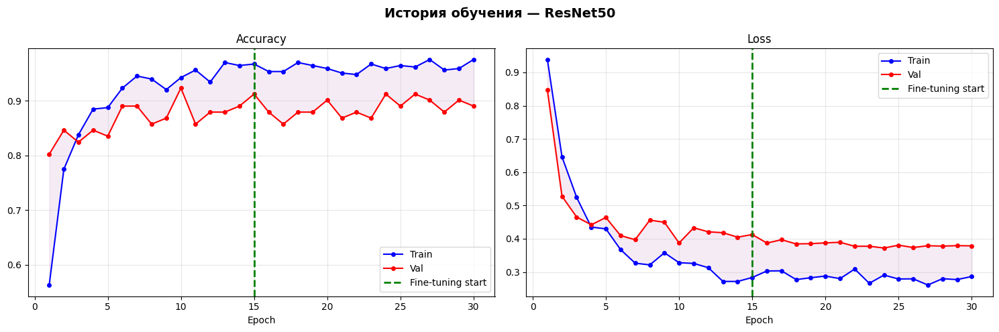

Сохранено: artifacts/ResNet50_history.png


In [17]:
plot_history(h_r1, h_r2, 'ResNet50')

### 5.3 Модель 2: EfficientNetB0

In [18]:
print('='*55); print('МОДЕЛЬ 2: EfficientNetB0'); print('='*55)
effnet = build_efficientnet(freeze_base=True).to(DEVICE)
tr = sum(p.numel() for p in effnet.parameters() if p.requires_grad)
tot= sum(p.numel() for p in effnet.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')

МОДЕЛЬ 2: EfficientNetB0
Trainable / Total: 361,731 / 4,369,279


In [19]:
h_e1 = train_stage(effnet, train_loader, val_loader,
                   EPOCHS_STAGE1, LR_STAGE1, 'EfficientNetB0 | Stage 1 (head)')


--- EfficientNetB0 | Stage 1 (head) | lr=0.001 ---


  Ep 01/15  loss=0.9947 acc=0.5192  val_loss=0.9283 val_acc=0.7033  [17s]


  Ep 02/15  loss=0.7742 acc=0.6786  val_loss=0.6963 val_acc=0.8132  [17s]


  Ep 03/15  loss=0.6795 acc=0.7720  val_loss=0.6099 val_acc=0.8022  [18s]


  Ep 04/15  loss=0.5813 acc=0.8049  val_loss=0.5492 val_acc=0.8242  [18s]


  Ep 05/15  loss=0.5725 acc=0.8187  val_loss=0.5319 val_acc=0.8242  [18s]


  Ep 06/15  loss=0.5339 acc=0.8242  val_loss=0.5195 val_acc=0.8571  [18s]


  Ep 07/15  loss=0.5607 acc=0.8407  val_loss=0.4491 val_acc=0.9011  [17s]


  Ep 08/15  loss=0.4838 acc=0.8516  val_loss=0.4478 val_acc=0.8901  [17s]


  Ep 09/15  loss=0.4700 acc=0.8489  val_loss=0.4446 val_acc=0.8901  [17s]


  Ep 10/15  loss=0.4651 acc=0.8709  val_loss=0.4298 val_acc=0.9011  [17s]


  Ep 11/15  loss=0.4939 acc=0.8599  val_loss=0.4332 val_acc=0.8791  [17s]


  Ep 12/15  loss=0.5083 acc=0.8544  val_loss=0.4355 val_acc=0.9011  [17s]


  Ep 13/15  loss=0.4472 acc=0.8791  val_loss=0.4070 val_acc=0.9231  [17s]


  Ep 14/15  loss=0.4411 acc=0.8736  val_loss=0.4422 val_acc=0.8462  [17s]


  Ep 15/15  loss=0.4848 acc=0.8654  val_loss=0.4527 val_acc=0.8791  [17s]
  Best val_acc: 0.9231


In [20]:
print('Разморозка EfficientNetB0...')
unfreeze_last(effnet, UNFREEZE_N)
h_e2 = train_stage(effnet, train_loader, val_loader,
                   EPOCHS_STAGE2, LR_STAGE2, 'EfficientNetB0 | Stage 2 (fine-tuning)')
save_path = MODELS_DIR / 'efficientnetb0_scifi.pth'
torch.save(effnet.state_dict(), save_path)
print(f'Модель сохранена: {save_path}')

Разморозка EfficientNetB0...
  Trainable: 1,769,187 / 4,369,279

--- EfficientNetB0 | Stage 2 (fine-tuning) | lr=1e-05 ---


  Ep 01/15  loss=0.4532 acc=0.8626  val_loss=0.4158 val_acc=0.9121  [18s]


  Ep 02/15  loss=0.4576 acc=0.8791  val_loss=0.4157 val_acc=0.8901  [17s]


  Ep 03/15  loss=0.4434 acc=0.8736  val_loss=0.4226 val_acc=0.8901  [18s]


  Ep 04/15  loss=0.4654 acc=0.8379  val_loss=0.4091 val_acc=0.9011  [17s]


  Ep 05/15  loss=0.4366 acc=0.8599  val_loss=0.4103 val_acc=0.8791  [17s]


  Ep 06/15  loss=0.4357 acc=0.8736  val_loss=0.4157 val_acc=0.8901  [18s]


  Ep 07/15  loss=0.4469 acc=0.8681  val_loss=0.4175 val_acc=0.8901  [17s]


  Ep 08/15  loss=0.4056 acc=0.8874  val_loss=0.4152 val_acc=0.9011  [17s]
  EarlyStopping.
  Best val_acc: 0.9121
Модель сохранена: models\efficientnetb0_scifi.pth


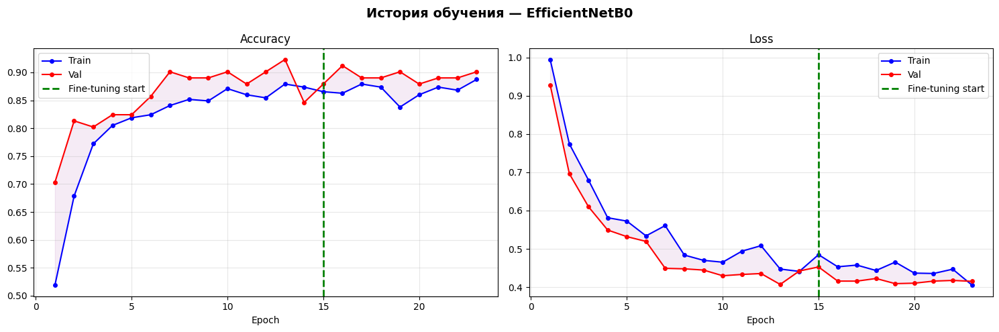

Сохранено: artifacts/EfficientNetB0_history.png


In [21]:
plot_history(h_e1, h_e2, 'EfficientNetB0')

## 6. Оценка моделей

In [22]:
@torch.no_grad()
def get_preds(model, loader):
    model.eval()
    all_true, all_pred, all_prob = [], [], []
    for imgs, labels in tqdm(loader, desc='Evaluating'):
        out   = model(imgs.to(DEVICE))
        probs = torch.softmax(out, 1).cpu().numpy()
        all_true.extend(labels.numpy())
        all_pred.extend(out.argmax(1).cpu().numpy())
        all_prob.extend(probs)
    return np.array(all_true), np.array(all_pred), np.array(all_prob)


def compute_report(y_true, y_pred, name, classes):
    print(f'\n{"="*50}\n{name}\n{"="*50}')
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec  = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1   = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    for k, v in [('Accuracy',acc),('Precision',prec),('Recall',rec),('F1-score',f1)]:
        print(f'  {k:<12}: {v:.4f}')
    print()
    print(classification_report(y_true, y_pred, target_names=classes, zero_division=0))
    return {'accuracy':acc,'precision':prec,'recall':rec,'f1':f1}


y_true_r, y_pred_r, y_prob_r = get_preds(resnet, val_loader)
y_true_e, y_pred_e, y_prob_e = get_preds(effnet, val_loader)
metrics_r = compute_report(y_true_r, y_pred_r, 'ResNet50',       classes_ordered)
metrics_e = compute_report(y_true_e, y_pred_e, 'EfficientNetB0', classes_ordered)

Evaluating: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


ResNet50
  Accuracy    : 0.9121
  Precision   : 0.9181
  Recall      : 0.9121
  F1-score    : 0.9119

              precision    recall  f1-score   support

   star gate       0.84      1.00      0.92        27
   star trek       0.96      0.86      0.91        29
   star wars       0.94      0.89      0.91        35

    accuracy                           0.91        91
   macro avg       0.91      0.92      0.91        91
weighted avg       0.92      0.91      0.91        91


EfficientNetB0
  Accuracy    : 0.9121
  Precision   : 0.9119
  Recall      : 0.9121
  F1-score    : 0.9118

              precision    recall  f1-score   support

   star gate       0.93      0.96      0.95        27
   star trek       0.90      0.90      0.90        29
   star wars       0.91      0.89      0.90        35

    accuracy                           0.91        91
   macro avg       0.91      0.92      0.91        91
weighted avg       0.91      0.91      0.91        91



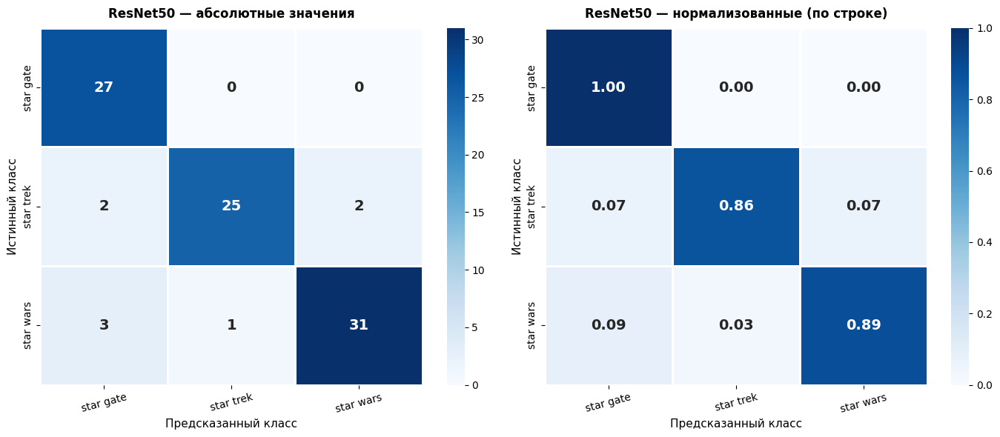

Сохранено: artifacts/ResNet50_confusion_matrix.png


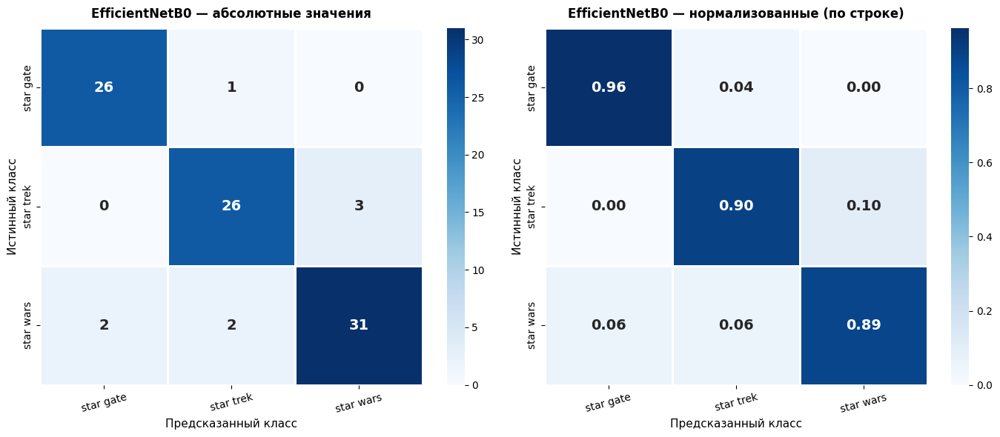

Сохранено: artifacts/EfficientNetB0_confusion_matrix.png


In [23]:
def plot_cm(y_true, y_pred, classes, name):
    cm  = confusion_matrix(y_true, y_pred)
    cmn = cm.astype('float') / cm.sum(axis=1, keepdims=True)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    for ax, d, t, fmt in zip(axes,
                              [cm, cmn],
                              [f'{name} — абсолютные значения',
                               f'{name} — нормализованные (по строке)'],
                              ['d', '.2f']):
        sns.heatmap(d, annot=True, fmt=fmt, cmap='Blues',
                    xticklabels=classes, yticklabels=classes,
                    ax=ax, linewidths=1, linecolor='white',
                    annot_kws={'size': 14, 'weight': 'bold'})
        ax.set_title(t, fontsize=12, fontweight='bold', pad=10)
        ax.set_xlabel('Предсказанный класс', fontsize=11)
        ax.set_ylabel('Истинный класс', fontsize=11)
        ax.tick_params(axis='x', rotation=15)
    plt.tight_layout()
    plt.savefig(ARTIFACTS_DIR / f'{name}_confusion_matrix.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Сохранено: {ARTIFACTS_DIR}/{name}_confusion_matrix.png')

plot_cm(y_true_r, y_pred_r, classes_ordered, 'ResNet50')
plot_cm(y_true_e, y_pred_e, classes_ordered, 'EfficientNetB0')

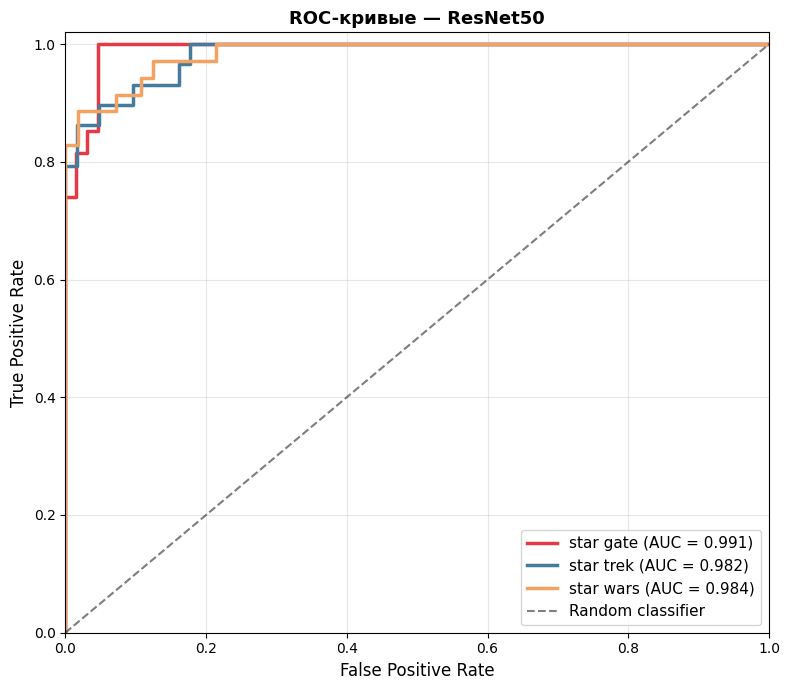

Сохранено: artifacts/ResNet50_roc.png


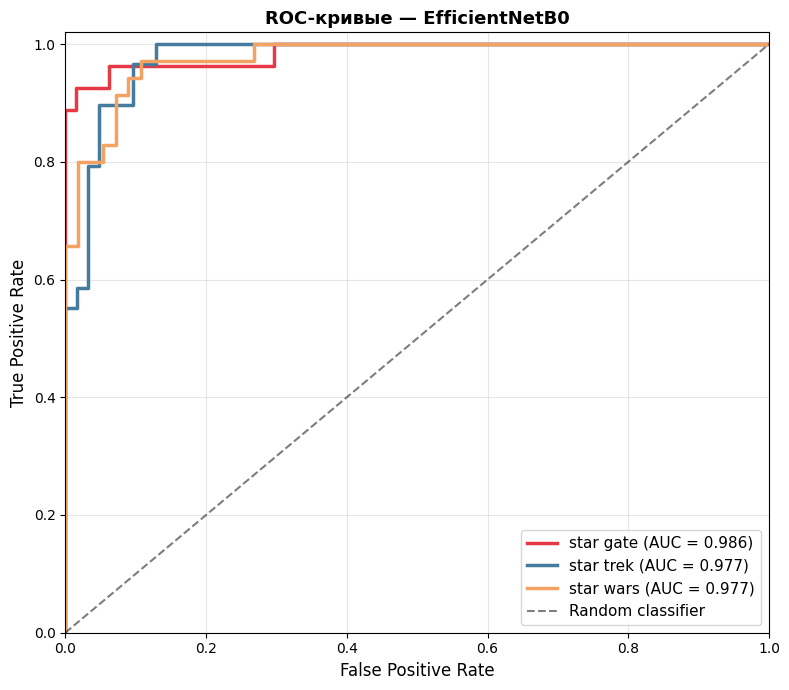

Сохранено: artifacts/EfficientNetB0_roc.png


In [24]:
# ROC-кривые (One-vs-Rest для 3 классов)
def plot_roc(y_true, y_prob, classes, name):
    y_bin = label_binarize(y_true, classes=list(range(len(classes))))
    fig, ax = plt.subplots(figsize=(8, 7))
    colors_roc = ['#E63946', '#457B9D', '#F4A261']
    for i, (cls, color) in enumerate(zip(classes, colors_roc)):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_prob[:, i])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, lw=2.5,
                label=f'{cls} (AUC = {roc_auc:.3f})')
    ax.plot([0,1],[0,1],'k--',lw=1.5,alpha=0.5,label='Random classifier')
    ax.fill_between([0,1],[0,1],[0,1],alpha=0.03,color='gray')
    ax.set_xlim([0,1]); ax.set_ylim([0,1.02])
    ax.set_xlabel('False Positive Rate', fontsize=12)
    ax.set_ylabel('True Positive Rate', fontsize=12)
    ax.set_title(f'ROC-кривые — {name}', fontsize=13, fontweight='bold')
    ax.legend(loc='lower right', fontsize=11)
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(ARTIFACTS_DIR / f'{name}_roc.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Сохранено: {ARTIFACTS_DIR}/{name}_roc.png')

plot_roc(y_true_r, y_prob_r, classes_ordered, 'ResNet50')
plot_roc(y_true_e, y_prob_e, classes_ordered, 'EfficientNetB0')

## 7. Сравнение моделей

In [25]:
keys = ['accuracy','precision','recall','f1']
labels_display = ['Accuracy','Precision (w)','Recall (w)','F1-score (w)']
cmp = pd.DataFrame({
    'Метрика': labels_display,
    'ResNet50': [metrics_r[k] for k in keys],
    'EfficientNetB0': [metrics_e[k] for k in keys],
})
cmp['Лучшая'] = cmp.apply(
    lambda r: '✅ ResNet50' if r['ResNet50']>=r['EfficientNetB0'] else '✅ EfficientNetB0', axis=1)
cmp['Разница'] = (cmp['ResNet50'] - cmp['EfficientNetB0']).apply(lambda x: f"{x:+.4f}")
print(cmp.to_string(index=False))
cmp.to_csv(ARTIFACTS_DIR / 'model_comparison.csv', index=False)
print(f'\nСохранено: {ARTIFACTS_DIR}/model_comparison.csv')

      Метрика  ResNet50  EfficientNetB0     Лучшая Разница
     Accuracy  0.912088        0.912088 ✅ ResNet50 +0.0000
Precision (w)  0.918073        0.911903 ✅ ResNet50 +0.0062
   Recall (w)  0.912088        0.912088 ✅ ResNet50 +0.0000
 F1-score (w)  0.911948        0.911830 ✅ ResNet50 +0.0001

Сохранено: artifacts/model_comparison.csv


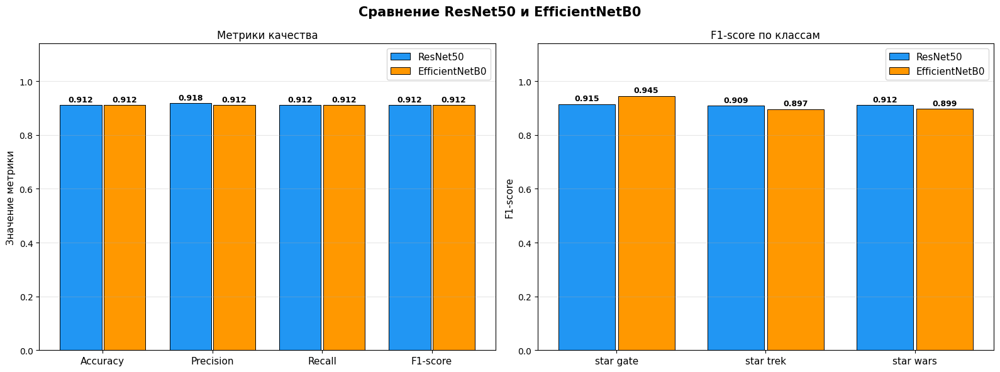

Сохранено: artifacts/model_comparison.png

✅ Лучшая модель по F1-score: ResNet50 (0.9119)


In [26]:
# Grouped bar chart
x = np.arange(4)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Сравнение ResNet50 и EfficientNetB0', fontsize=15, fontweight='bold')

# Bar chart метрик
ax = axes[0]
b1 = ax.bar(x-0.2, [metrics_r[k] for k in keys], 0.38,
            label='ResNet50', color='#2196F3', edgecolor='black', lw=0.7)
b2 = ax.bar(x+0.2, [metrics_e[k] for k in keys], 0.38,
            label='EfficientNetB0', color='#FF9800', edgecolor='black', lw=0.7)
for b in list(b1)+list(b2):
    ax.text(b.get_x()+b.get_width()/2, b.get_height()+0.005,
            f'{b.get_height():.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
ax.set_ylim(0, 1.14); ax.set_xticks(x)
ax.set_xticklabels(['Accuracy','Precision','Recall','F1-score'], fontsize=11)
ax.set_ylabel('Значение метрики', fontsize=11)
ax.set_title('Метрики качества', fontsize=12); ax.legend(fontsize=11); ax.grid(axis='y', alpha=0.3)

# Radar-подобный bar chart по классам (F1 per class)
ax2 = axes[1]
r_f1 = f1_score(y_true_r, y_pred_r, average=None, zero_division=0)
e_f1 = f1_score(y_true_e, y_pred_e, average=None, zero_division=0)
xc = np.arange(NUM_CLASSES)
b3 = ax2.bar(xc-0.2, r_f1, 0.38, label='ResNet50',       color='#2196F3', edgecolor='black', lw=0.7)
b4 = ax2.bar(xc+0.2, e_f1, 0.38, label='EfficientNetB0', color='#FF9800', edgecolor='black', lw=0.7)
for b in list(b3)+list(b4):
    ax2.text(b.get_x()+b.get_width()/2, b.get_height()+0.005,
             f'{b.get_height():.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
ax2.set_ylim(0, 1.14); ax2.set_xticks(xc)
ax2.set_xticklabels(classes_ordered, fontsize=11)
ax2.set_ylabel('F1-score', fontsize=11)
ax2.set_title('F1-score по классам', fontsize=12); ax2.legend(fontsize=11); ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/model_comparison.png')

winner = 'ResNet50' if metrics_r['f1']>=metrics_e['f1'] else 'EfficientNetB0'
print(f'\n✅ Лучшая модель по F1-score: {winner} ({max(metrics_r["f1"],metrics_e["f1"]):.4f})')

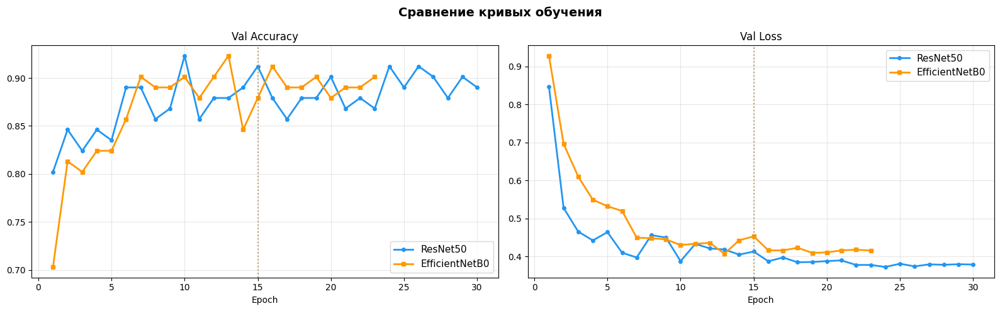

Сохранено: artifacts/learning_curves_comparison.png


In [27]:
# Кривые обучения — сравнение обеих моделей на одном графике
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Сравнение кривых обучения', fontsize=14, fontweight='bold')

for ax, metric_key, title in zip(axes, ['va','vl'], ['Val Accuracy', 'Val Loss']):
    r_vals = h_r1[metric_key] + h_r2[metric_key]
    e_vals = h_e1[metric_key] + h_e2[metric_key]
    sp_r   = len(h_r1[metric_key])
    sp_e   = len(h_e1[metric_key])
    ep_r   = range(1, len(r_vals)+1)
    ep_e   = range(1, len(e_vals)+1)
    ax.plot(ep_r, r_vals, '-o', ms=4, lw=2, color='#2196F3', label='ResNet50')
    ax.plot(ep_e, e_vals, '-s', ms=4, lw=2, color='#FF9800', label='EfficientNetB0')
    ax.axvline(sp_r, color='#2196F3', ls=':', lw=1.5, alpha=0.6)
    ax.axvline(sp_e, color='#FF9800', ls=':', lw=1.5, alpha=0.6)
    ax.set_title(title, fontsize=12); ax.set_xlabel('Epoch')
    ax.legend(fontsize=11); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'learning_curves_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/learning_curves_comparison.png')

## 8. Grad-CAM — визуализация внимания модели

In [28]:
import cv2

class GradCAM:
    """Grad-CAM через PyTorch forward/backward хуки."""
    def __init__(self, model, layer):
        self.model = model; self.grads = None; self.acts = None
        layer.register_forward_hook(
            lambda m, i, o: setattr(self, 'acts', o.detach()))
        layer.register_full_backward_hook(
            lambda m, gi, go: setattr(self, 'grads', go[0].detach()))

    def __call__(self, t):
        self.model.eval()
        out  = self.model(t.unsqueeze(0).to(DEVICE))
        pred = out.argmax().item()
        conf = torch.softmax(out, 1)[0, pred].item()
        self.model.zero_grad()
        out[0, pred].backward()
        w   = self.grads.mean(dim=[2,3], keepdim=True)
        cam = torch.relu((w * self.acts).sum(1)).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, pred, conf


def overlay(pil_img, cam, alpha=0.45):
    img = np.array(pil_img.resize((IMG_SIZE, IMG_SIZE)))
    h   = cv2.applyColorMap(
        np.uint8(255 * cv2.resize(cam, (IMG_SIZE, IMG_SIZE))),
        cv2.COLORMAP_JET
    )
    h = cv2.cvtColor(h, cv2.COLOR_BGR2RGB)
    return np.uint8((1-alpha)*img + alpha*h)


gcam_r = GradCAM(resnet, resnet.layer4[-1])
gcam_e = GradCAM(effnet, effnet.features[-1])
print('Grad-CAM инициализирован.')

Grad-CAM инициализирован.


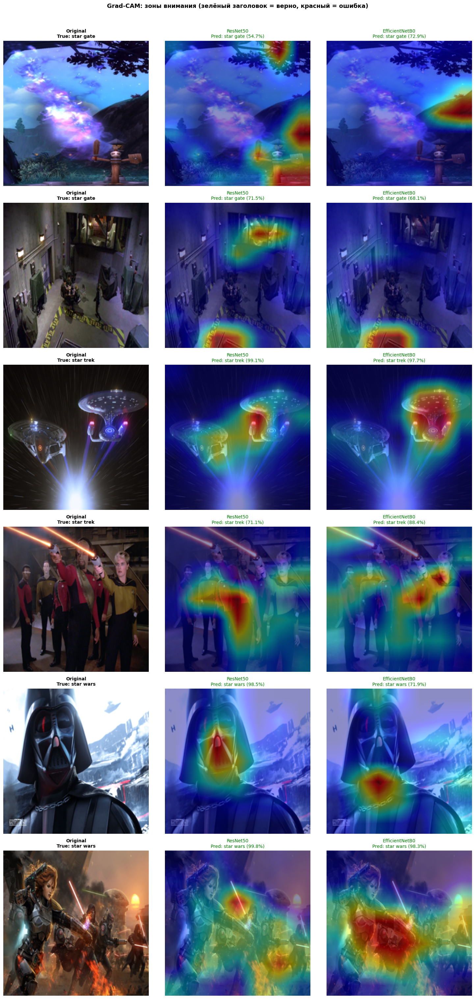

Сохранено: artifacts/gradcam_comparison.png


In [29]:
# По 2 примера из каждого класса
samples_per_class = 2
all_samples = []
for d in subdirs:
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) + list(d.glob('*.webp'))
    np.random.shuffle(imgs)
    for p in imgs[:samples_per_class]:
        all_samples.append((p, d.name))

n_rows = len(all_samples)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5*n_rows))
fig.suptitle('Grad-CAM: зоны внимания (зелёный заголовок = верно, красный = ошибка)',
             fontsize=13, fontweight='bold', y=1.01)

for row, (path, true_cls) in enumerate(all_samples):
    try:
        pil = Image.open(path).convert('RGB')
    except:
        continue
    t = val_tf(pil)
    cr, pr, confr = gcam_r(t)
    ce, pe, confe = gcam_e(t)
    nr = classes_ordered[pr]; ne = classes_ordered[pe]

    axes[row][0].imshow(pil.resize((IMG_SIZE,IMG_SIZE)))
    axes[row][0].set_title(f'Original\nTrue: {true_cls}', fontsize=10, fontweight='bold')
    axes[row][0].axis('off')

    axes[row][1].imshow(overlay(pil, cr))
    col = 'green' if nr == true_cls else 'red'
    axes[row][1].set_title(f'ResNet50\nPred: {nr} ({confr:.1%})', fontsize=10, color=col)
    axes[row][1].axis('off')

    axes[row][2].imshow(overlay(pil, ce))
    col = 'green' if ne == true_cls else 'red'
    axes[row][2].set_title(f'EfficientNetB0\nPred: {ne} ({confe:.1%})', fontsize=10, color=col)
    axes[row][2].axis('off')

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'gradcam_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/gradcam_comparison.png')

## 9. Анализ ошибок и уверенности модели

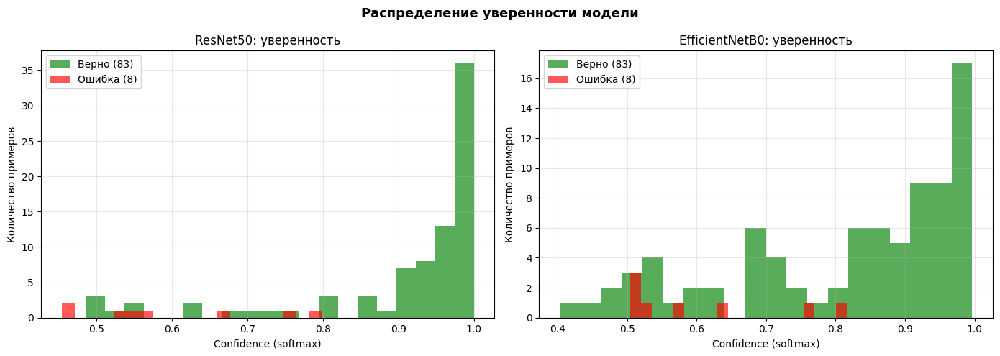

Сохранено: artifacts/confidence_distribution.png


In [30]:
# Гистограммы уверенности (confidence) для верных и неверных предсказаний
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Распределение уверенности модели', fontsize=13, fontweight='bold')

for ax, (y_true, y_pred, y_prob, name) in zip(axes, [
    (y_true_r, y_pred_r, y_prob_r, 'ResNet50'),
    (y_true_e, y_pred_e, y_prob_e, 'EfficientNetB0')
]):
    conf_vals = y_prob[np.arange(len(y_pred)), y_pred]
    correct   = y_true == y_pred
    ax.hist(conf_vals[correct],  bins=20, alpha=0.65, color='green',  label=f'Верно ({correct.sum()})')
    ax.hist(conf_vals[~correct], bins=20, alpha=0.65, color='red',    label=f'Ошибка ({(~correct).sum()})')
    ax.set_title(f'{name}: уверенность', fontsize=12)
    ax.set_xlabel('Confidence (softmax)'); ax.set_ylabel('Количество примеров')
    ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / 'confidence_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Сохранено: {ARTIFACTS_DIR}/confidence_distribution.png')

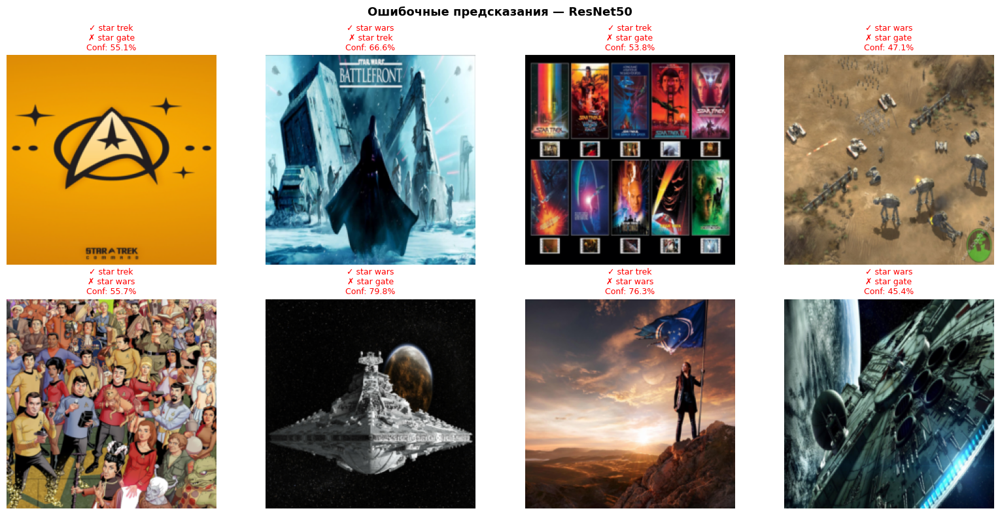

Сохранено: artifacts/misclassified_resnet.png


In [31]:
# Примеры ошибочных предсказаний ResNet50
all_val_imgs = []
for imgs_b, _ in val_loader:
    all_val_imgs.extend(imgs_b)
all_val_imgs = all_val_imgs[:len(y_true_r)]

wrong_idx = np.where(y_true_r != y_pred_r)[0]
if len(wrong_idx) > 0:
    n_show   = min(8, len(wrong_idx))
    sample_w = np.random.choice(wrong_idx, n_show, replace=False)
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle('Ошибочные предсказания — ResNet50', fontsize=13, fontweight='bold')
    for ax, idx in zip(axes.flatten(), sample_w):
        ax.imshow(denorm(all_val_imgs[idx]))
        true_name = classes_ordered[y_true_r[idx]]
        pred_name = classes_ordered[y_pred_r[idx]]
        conf_val  = y_prob_r[idx][y_pred_r[idx]]
        ax.set_title(f'✓ {true_name}\n✗ {pred_name}\nConf: {conf_val:.1%}',
                     fontsize=9, color='red')
        ax.axis('off')
    for ax in axes.flatten()[n_show:]: ax.axis('off')
    plt.tight_layout()
    plt.savefig(ARTIFACTS_DIR / 'misclassified_resnet.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Сохранено: {ARTIFACTS_DIR}/misclassified_resnet.png')
else:
    print('ResNet50 не допустил ошибок на валидации!')

## 10. Итоговая сводка

In [32]:
print('='*60)
print('ИТОГОВАЯ СВОДКА')
print('='*60)
print(f'Датасет  : {total_images} изображений, {NUM_CLASSES} класса')
print(f'Классы   : {classes_ordered}')
print(f'Train/Val: {n_train}/{n_val}  |  Device: {DEVICE}')
print()
for name, m in [('ResNet50', metrics_r), ('EfficientNetB0', metrics_e)]:
    print(f'{name}:')
    for k, v in m.items(): print(f'  {k:<12}: {v:.4f}')
    print()
winner = 'ResNet50' if metrics_r['f1']>=metrics_e['f1'] else 'EfficientNetB0'
loser  = 'EfficientNetB0' if winner=='ResNet50' else 'ResNet50'
delta  = abs(metrics_r['f1']-metrics_e['f1'])
print(f'>>> Победитель : {winner}')
print(f'>>> Отставание {loser}: {delta:.4f} по F1-score')
print()
print('Сохранённые артефакты:')
for f in sorted(ARTIFACTS_DIR.glob('*')): print(f'  {f}')
print('\nСохранённые модели:')
for f in sorted(MODELS_DIR.glob('*')): print(f'  {f}')

ИТОГОВАЯ СВОДКА
Датасет  : 397 изображений, 3 класса
Классы   : ['star gate', 'star trek', 'star wars']
Train/Val: 364/91  |  Device: cuda

ResNet50:
  accuracy    : 0.9121
  precision   : 0.9181
  recall      : 0.9121
  f1          : 0.9119

EfficientNetB0:
  accuracy    : 0.9121
  precision   : 0.9119
  recall      : 0.9121
  f1          : 0.9118

>>> Победитель : ResNet50
>>> Отставание EfficientNetB0: 0.0001 по F1-score

Сохранённые артефакты:
  artifacts\augmented_samples.png
  artifacts\class_distribution.png
  artifacts\confidence_distribution.png
  artifacts\EfficientNetB0_confusion_matrix.png
  artifacts\EfficientNetB0_history.png
  artifacts\EfficientNetB0_roc.png
  artifacts\gradcam_comparison.png
  artifacts\image_size_distribution.png
  artifacts\learning_curves_comparison.png
  artifacts\misclassified_resnet.png
  artifacts\model_comparison.csv
  artifacts\model_comparison.png
  artifacts\ResNet50_confusion_matrix.png
  artifacts\ResNet50_history.png
  artifacts\ResNet50_